### Import Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from numpy.linalg import LinAlgError
import scipy
from plot_inlier_matches import plot_inlier_matches
import skimage

### Sub-part 1: Glendon Hall

First, stitch the middle and right image together

In [2]:
## load and convert both images to grayscale
img2_bgr = cv2.imread('images/Glendon-Hall-middle-resized.jpg')
img3_bgr = cv2.imread('images/Glendon-Hall-right-resized.jpg')

img2_rgb = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2RGB)
img3_rgb = cv2.cvtColor(img3_bgr, cv2.COLOR_BGR2RGB)

img2_gray = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2GRAY)
img3_gray = cv2.cvtColor(img3_bgr, cv2.COLOR_BGR2GRAY)

detect keypoints and extract descriptors

In [3]:
kp2, des2 = cv2.SIFT_create().detectAndCompute(img2_gray, None)
kp3, des3 = cv2.SIFT_create().detectAndCompute(img3_gray, None)

match features

In [4]:
## match features
dm = scipy.spatial.distance.cdist(des2, des3, 'sqeuclidean')

prune features

In [5]:
## n = number of best matches
n = 400

## sort and get best n matches
dm_sorted = np.argsort(dm.flatten())[:n]
row, col = np.unravel_index(dm_sorted, dm.shape)

## convert keypoints from cv2.KeyPoint to np.float64, only keep top n matches
kp2_closest = np.array([kp.pt for kp in kp2])[row]
kp3_closest = np.array([kp.pt for kp in kp3])[col]

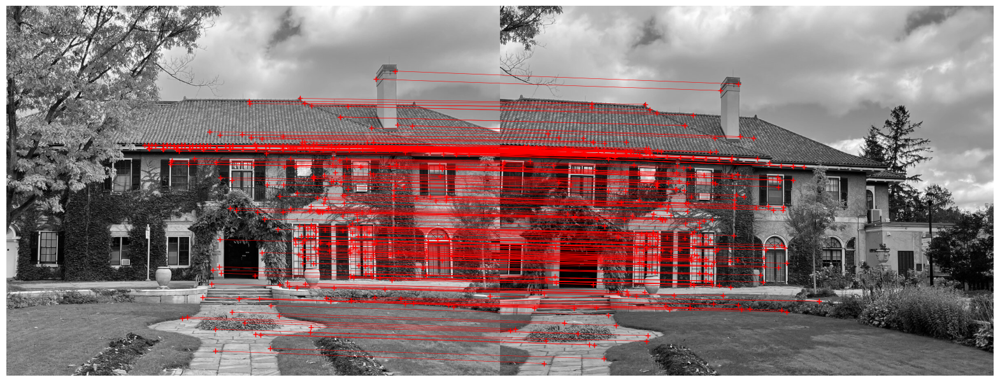

In [6]:
## visualize keypoints
inlier_matrix = np.hstack((kp2_closest, kp3_closest))
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, img2_gray, img3_gray, inlier_matrix)

robust transformation estimation

In [7]:
## define number of iterations and threshold
num_iter = 50000
threshold = 0.15

## variables to hold best inliers and count
inlier_count = 0
best_inliers_idx = None

## RANSAC
for i in range(num_iter):
    retry_iteration = True

    while retry_iteration:
        try:
            ## select 4 random indices
            random_idx = np.random.choice(kp2_closest.shape[0], size=4, replace=False)

            img2_pts = kp2_closest[random_idx]
            img3_pts = kp3_closest[random_idx]

            ## construct matrix A as given by model fitting notes page 196
            ## append homogeneous equations, two for each set of points, eight in total
            A = []
            
            for pt in range(4):
                x0, y0 = img2_pts[pt]
                x1, y1 = img3_pts[pt]
                A.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
                A.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

            ## estimate homography with SVD
            U, S, V = np.linalg.svd(np.array(A))
            H = V[len(V)-1].reshape(3, 3)

            ## calculate the n img3 points with the estimated T and c
            img3_new = np.hstack((kp2_closest, np.ones((kp2_closest.shape[0], 1)))) @ np.transpose(H)
            
            ## divide by last component
            for r in range(img3_new.shape[0]):
                img3_new[r, :2] /= img3_new[r, 2]

            ## remove the last column because we only need x and y
            img3_new = img3_new[:, :-1]

            ## compute the euclidean distance and count entries that are within the radius threshold
            distance = np.linalg.norm(img3_new - kp3_closest, axis=1)
            inliers = np.where(distance < threshold)[0]
            count = len(inliers)

            ## save the best affine matrix and inlier counts
            if count > inlier_count:
                inlier_count = count
                best_inliers_idx = inliers

            print(f"Iteration {i} - count (current): {count} - count (best): {inlier_count}")
            retry_iteration = False

        ## sometimes A does not have an inverse, in that case, choose 3 sets of points randomly again
        except LinAlgError:
            continue

Iteration 0 - count (current): 5 - count (best): 5
Iteration 1 - count (current): 4 - count (best): 5
Iteration 2 - count (current): 6 - count (best): 6
Iteration 3 - count (current): 4 - count (best): 6
Iteration 4 - count (current): 4 - count (best): 6
Iteration 5 - count (current): 5 - count (best): 6
Iteration 6 - count (current): 4 - count (best): 6
Iteration 7 - count (current): 5 - count (best): 6
Iteration 8 - count (current): 5 - count (best): 6
Iteration 9 - count (current): 5 - count (best): 6
Iteration 10 - count (current): 5 - count (best): 6
Iteration 11 - count (current): 5 - count (best): 6
Iteration 12 - count (current): 5 - count (best): 6
Iteration 13 - count (current): 4 - count (best): 6
Iteration 14 - count (current): 5 - count (best): 6
Iteration 15 - count (current): 4 - count (best): 6
Iteration 16 - count (current): 17 - count (best): 17
Iteration 17 - count (current): 5 - count (best): 17
Iteration 18 - count (current): 5 - count (best): 17
Iteration 19 - cou

C:\Users\User\AppData\Local\Temp\ipykernel_21180\987859564.py:40: RuntimeWarning: divide by zero encountered in divide
  img3_new[r, :2] /= img3_new[r, 2]


Iteration 16123 - count (current): 5 - count (best): 50
Iteration 16124 - count (current): 4 - count (best): 50
Iteration 16125 - count (current): 15 - count (best): 50
Iteration 16126 - count (current): 5 - count (best): 50
Iteration 16127 - count (current): 5 - count (best): 50
Iteration 16128 - count (current): 6 - count (best): 50
Iteration 16129 - count (current): 13 - count (best): 50
Iteration 16130 - count (current): 16 - count (best): 50
Iteration 16131 - count (current): 6 - count (best): 50
Iteration 16132 - count (current): 5 - count (best): 50
Iteration 16133 - count (current): 4 - count (best): 50
Iteration 16134 - count (current): 2 - count (best): 50
Iteration 16135 - count (current): 12 - count (best): 50
Iteration 16136 - count (current): 5 - count (best): 50
Iteration 16137 - count (current): 8 - count (best): 50
Iteration 16138 - count (current): 6 - count (best): 50
Iteration 16139 - count (current): 6 - count (best): 50
Iteration 16140 - count (current): 5 - count

C:\Users\User\AppData\Local\Temp\ipykernel_21180\987859564.py:40: RuntimeWarning: invalid value encountered in divide
  img3_new[r, :2] /= img3_new[r, 2]


Iteration 43663 - count (current): 5 - count (best): 50
Iteration 43664 - count (current): 4 - count (best): 50
Iteration 43665 - count (current): 11 - count (best): 50
Iteration 43666 - count (current): 5 - count (best): 50
Iteration 43667 - count (current): 5 - count (best): 50
Iteration 43668 - count (current): 5 - count (best): 50
Iteration 43669 - count (current): 5 - count (best): 50
Iteration 43670 - count (current): 6 - count (best): 50
Iteration 43671 - count (current): 5 - count (best): 50
Iteration 43672 - count (current): 5 - count (best): 50
Iteration 43673 - count (current): 5 - count (best): 50
Iteration 43674 - count (current): 8 - count (best): 50
Iteration 43675 - count (current): 5 - count (best): 50
Iteration 43676 - count (current): 6 - count (best): 50
Iteration 43677 - count (current): 6 - count (best): 50
Iteration 43678 - count (current): 4 - count (best): 50
Iteration 43679 - count (current): 6 - count (best): 50
Iteration 43680 - count (current): 13 - count (

compute optimal transformation

In [8]:
## get all the inliers of the best transformation found using RANSAC
img2_pts_final = kp2_closest[best_inliers_idx]
img3_pts_final = kp3_closest[best_inliers_idx]

A_final = []

for pt in range(inlier_count):
    x0, y0 = img2_pts_final[pt]
    x1, y1 = img3_pts_final[pt]
    A_final.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
    A_final.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

## compute the final T and c with least-squares
U_final, S_final, V_final = np.linalg.svd(np.array(A_final))
H_final = V_final[len(V_final)-1].reshape(3, 3)

create panorama

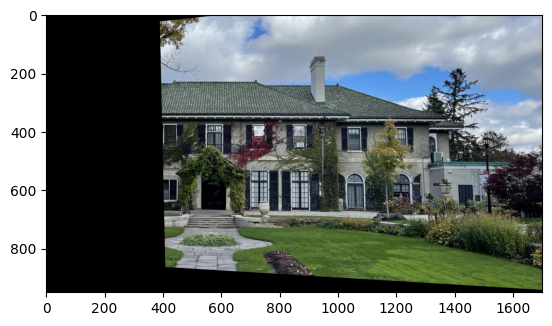

In [9]:
## perform image warping
transform = skimage.transform.ProjectiveTransform(H_final)
warped_img3 = skimage.transform.warp(img3_rgb, transform, output_shape=(950, 1700))

plt.imshow(warped_img3)

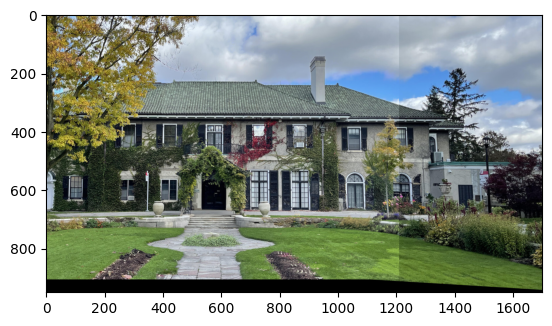

In [10]:
## add more pixels on the right of img1 to create the panorama
padded_img2 = np.pad(img2_rgb, ((0, 43), (0, 490), (0, 0)), mode='constant', constant_values=0.0).astype(np.float32) / 255.

## take the maximum of both images
plt.imshow(np.maximum(padded_img2, warped_img3))

Now, stitch the left and stitched image together

In [11]:
## secondly, stitch the first and stitched images
## load and convert both images to grayscale
img1_bgr = cv2.imread('images/Glendon-Hall-left-resized.jpg')

img1_rgb = cv2.cvtColor(img1_bgr, cv2.COLOR_BGR2RGB)
img4_rgb = (np.maximum(padded_img2, warped_img3) * 255.).astype(np.uint8)

img1_gray = cv2.cvtColor(img1_bgr, cv2.COLOR_BGR2GRAY)
img4_gray = cv2.cvtColor(img4_rgb, cv2.COLOR_RGB2GRAY)

detect keypoints and extract descriptors

In [12]:
kp1, des1 = cv2.SIFT_create().detectAndCompute(img1_gray, None)
kp4, des4 = cv2.SIFT_create().detectAndCompute(img4_gray, None)

match features

In [13]:
dm2 = scipy.spatial.distance.cdist(des1, des4, 'sqeuclidean')

prune features

In [14]:
## n = number of best matches
n = 400

## sort and get best n matches
dm2_sorted = np.argsort(dm2.flatten())[:n]
row2, col2 = np.unravel_index(dm2_sorted, dm2.shape)

## convert keypoints from cv2.KeyPoint to np.float64, only keep top n matches
kp1_closest = np.array([kp.pt for kp in kp1])[row2]
kp4_closest = np.array([kp.pt for kp in kp4])[col2]

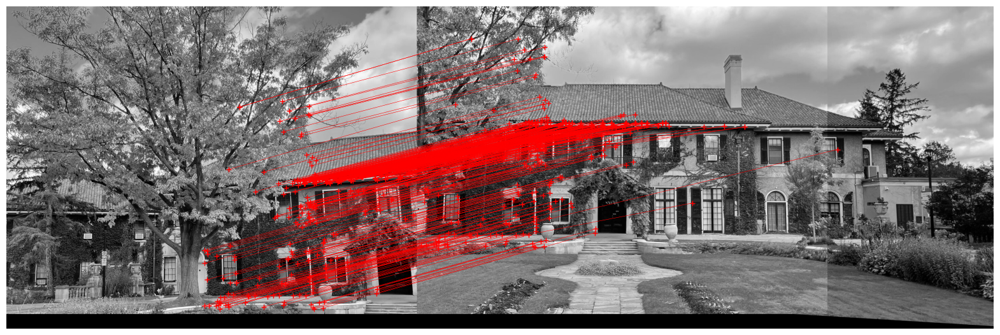

In [15]:
## visualize keypoints
inlier_matrix2 = np.hstack((kp1_closest, kp4_closest))
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, np.pad(img1_gray, ((0, img4_gray.shape[0] - img1_gray.shape[0]), (0, 0)), mode='constant', constant_values=0.0), img4_gray, inlier_matrix2)

robust transformation estimation

In [16]:
## define number of iterations and threshold
num_iter = 50000
threshold = 0.15

## variables to hold best inliers and count
inlier_count = 0
best_inliers_idx = None

## RANSAC
for i in range(num_iter):
    retry_iteration = True

    while retry_iteration:
        try:
            ## select 4 random minimum points
            random_idx = np.random.choice(kp1_closest.shape[0], size=4, replace=False)

            img1_pts = kp1_closest[random_idx]
            img4_pts = kp4_closest[random_idx]

            ## construct matrix A as given by model fitting notes page 196
            ## append homogeneous equations, two for each set of points, eight in total
            A = []
            
            for pt in range(4):
                x0, y0 = img1_pts[pt]
                x1, y1 = img4_pts[pt]
                A.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
                A.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

            ## estimate homography with SVD
            U, S, V = np.linalg.svd(np.array(A))
            H = V[len(V)-1].reshape(3, 3)

            ## calculate the n x2 points with the estimated T and c
            img4_new = np.hstack((kp1_closest, np.ones((kp1_closest.shape[0], 1)))) @ np.transpose(H)
            
            ## divide by last component
            for r in range(img4_new.shape[0]):
                img4_new[r, :2] /= img4_new[r, 2]

            ## remove the last column because we only need x and y
            img4_new = img4_new[:, :-1]

            ## compute the euclidean distance and count entries that are within the radius threshold
            distance = np.linalg.norm(img4_new - kp4_closest, axis=1)
            inliers = np.where(distance < threshold)[0]
            count = len(inliers)

            ## save the best affine matrix and inlier counts
            if count > inlier_count:
                inlier_count = count
                best_inliers_idx = inliers

            print(f"Iteration {i} - count (current): {count} - count (best): {inlier_count}")
            retry_iteration = False

        ## sometimes A does not have an inverse, in that case, choose 3 sets of points randomly again
        except LinAlgError:
            continue

Iteration 0 - count (current): 6 - count (best): 6
Iteration 1 - count (current): 5 - count (best): 6
Iteration 2 - count (current): 6 - count (best): 6
Iteration 3 - count (current): 7 - count (best): 7
Iteration 4 - count (current): 2 - count (best): 7
Iteration 5 - count (current): 7 - count (best): 7
Iteration 6 - count (current): 7 - count (best): 7
Iteration 7 - count (current): 8 - count (best): 8
Iteration 8 - count (current): 6 - count (best): 8
Iteration 9 - count (current): 5 - count (best): 8
Iteration 10 - count (current): 4 - count (best): 8
Iteration 11 - count (current): 4 - count (best): 8
Iteration 12 - count (current): 5 - count (best): 8
Iteration 13 - count (current): 6 - count (best): 8
Iteration 14 - count (current): 5 - count (best): 8
Iteration 15 - count (current): 7 - count (best): 8
Iteration 16 - count (current): 6 - count (best): 8
Iteration 17 - count (current): 6 - count (best): 8
Iteration 18 - count (current): 6 - count (best): 8
Iteration 19 - count (

C:\Users\User\AppData\Local\Temp\ipykernel_21180\1515947706.py:40: RuntimeWarning: divide by zero encountered in divide
  img4_new[r, :2] /= img4_new[r, 2]


Iteration 232 - count (current): 6 - count (best): 34
Iteration 233 - count (current): 6 - count (best): 34
Iteration 234 - count (current): 6 - count (best): 34
Iteration 235 - count (current): 5 - count (best): 34
Iteration 236 - count (current): 6 - count (best): 34
Iteration 237 - count (current): 7 - count (best): 34
Iteration 238 - count (current): 7 - count (best): 34
Iteration 239 - count (current): 6 - count (best): 34
Iteration 240 - count (current): 2 - count (best): 34
Iteration 241 - count (current): 5 - count (best): 34
Iteration 242 - count (current): 7 - count (best): 34
Iteration 243 - count (current): 5 - count (best): 34
Iteration 244 - count (current): 4 - count (best): 34
Iteration 245 - count (current): 5 - count (best): 34
Iteration 246 - count (current): 5 - count (best): 34
Iteration 247 - count (current): 4 - count (best): 34
Iteration 248 - count (current): 6 - count (best): 34
Iteration 249 - count (current): 6 - count (best): 34
Iteration 250 - count (curre

C:\Users\User\AppData\Local\Temp\ipykernel_21180\1515947706.py:40: RuntimeWarning: invalid value encountered in divide
  img4_new[r, :2] /= img4_new[r, 2]


Iteration 5832 - count (current): 5 - count (best): 34
Iteration 5833 - count (current): 6 - count (best): 34
Iteration 5834 - count (current): 5 - count (best): 34
Iteration 5835 - count (current): 5 - count (best): 34
Iteration 5836 - count (current): 7 - count (best): 34
Iteration 5837 - count (current): 7 - count (best): 34
Iteration 5838 - count (current): 4 - count (best): 34
Iteration 5839 - count (current): 6 - count (best): 34
Iteration 5840 - count (current): 6 - count (best): 34
Iteration 5841 - count (current): 6 - count (best): 34
Iteration 5842 - count (current): 6 - count (best): 34
Iteration 5843 - count (current): 7 - count (best): 34
Iteration 5844 - count (current): 11 - count (best): 34
Iteration 5845 - count (current): 4 - count (best): 34
Iteration 5846 - count (current): 9 - count (best): 34
Iteration 5847 - count (current): 6 - count (best): 34
Iteration 5848 - count (current): 12 - count (best): 34
Iteration 5849 - count (current): 4 - count (best): 34
Iteratio

compute optimal transformation

In [17]:
## get all the inliers of the best transformation found using RANSAC
img1_pts_final = kp1_closest[best_inliers_idx]
img4_pts_final = kp4_closest[best_inliers_idx]

A_final = []

for pt in range(inlier_count):
    x0, y0 = img1_pts_final[pt]
    x1, y1 = img4_pts_final[pt]
    A_final.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
    A_final.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

## compute the final T and c with least-squares
U_final, S_final, V_final = np.linalg.svd(np.array(A_final))
H_final = V_final[len(V_final)-1].reshape(3, 3)

create final panorama

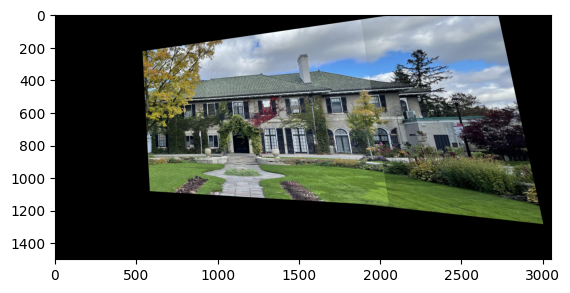

In [18]:
## perform image warping
transform = skimage.transform.ProjectiveTransform(H_final)
warped_img4 = skimage.transform.warp(img4_rgb, transform, output_shape=(1500, 3050))

plt.imshow(warped_img4)

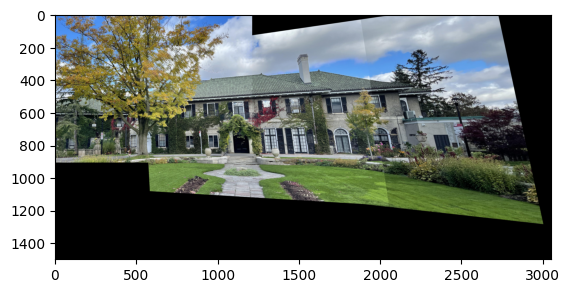

In [19]:
## add more pixels on the right of img1 to create the panorama
padded_img1 = np.pad(img1_rgb, ((0, 593), (0, 1840), (0, 0)), mode='constant', constant_values=0.0).astype(np.float32) / 255.

## take the maximum of both images
plt.imshow(np.maximum(padded_img1, warped_img4))

### Sub-part 2: My choice of image triplet

Source: https://github.com/SSARCandy/panoramas-image-stitching/tree/master/input_image/grail

First, stitch the middle and right image together

In [20]:
## load and convert both images to grayscale
img2_bgr = cv2.imread('images/room-middle.jpg')
img3_bgr = cv2.imread('images/room-right.jpg')

img2_rgb = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2RGB)
img3_rgb = cv2.cvtColor(img3_bgr, cv2.COLOR_BGR2RGB)

img2_gray = cv2.cvtColor(img2_bgr, cv2.COLOR_BGR2GRAY)
img3_gray = cv2.cvtColor(img3_bgr, cv2.COLOR_BGR2GRAY)

detect keypoints and extract descriptors

In [21]:
kp2, des2 = cv2.SIFT_create().detectAndCompute(img2_gray, None)
kp3, des3 = cv2.SIFT_create().detectAndCompute(img3_gray, None)

match features

In [22]:
dm = scipy.spatial.distance.cdist(des2, des3, 'sqeuclidean')

prune features

In [23]:
## n = number of best matches
n = 30

## sort and get best n matches
dm_sorted = np.argsort(dm.flatten())[:n]
row, col = np.unravel_index(dm_sorted, dm.shape)

## convert keypoints from cv2.KeyPoint to np.float64, only keep top n matches
kp2_closest = np.array([kp.pt for kp in kp2])[row]
kp3_closest = np.array([kp.pt for kp in kp3])[col]

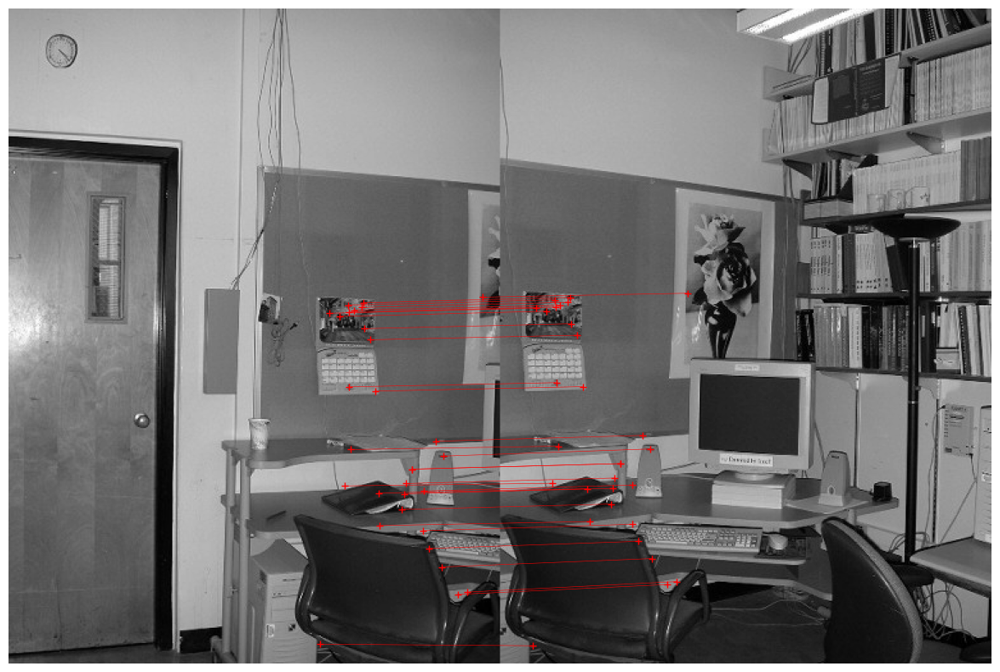

In [24]:
## visualize keypoints
inlier_matrix = np.hstack((kp2_closest, kp3_closest))
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, img2_gray, img3_gray, inlier_matrix)

robust transformation estimation

In [25]:
## define number of iterations and threshold
num_iter = 200
threshold = 0.15

## variables to hold best inliers and count
inlier_count = 0
best_inliers_idx = None

## RANSAC
for i in range(num_iter):
    retry_iteration = True

    while retry_iteration:
        try:
            ## select 4 random indices
            random_idx = np.random.choice(kp2_closest.shape[0], size=4, replace=False)

            img2_pts = kp2_closest[random_idx]
            img3_pts = kp3_closest[random_idx]

            ## construct matrix A as given by model fitting notes page 196
            ## append homogeneous equations, two for each set of points, eight in total
            A = []
            
            for pt in range(4):
                x0, y0 = img2_pts[pt]
                x1, y1 = img3_pts[pt]
                A.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
                A.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

            ## estimate homography with SVD
            U, S, V = np.linalg.svd(np.array(A))
            H = V[len(V)-1].reshape(3, 3)

            ## calculate the n img3 points with the estimated T and c
            img3_new = np.hstack((kp2_closest, np.ones((kp2_closest.shape[0], 1)))) @ np.transpose(H)
            
            ## divide by last component
            for r in range(img3_new.shape[0]):
                img3_new[r, :2] /= img3_new[r, 2]

            ## remove the last column because we only need x and y
            img3_new = img3_new[:, :-1]

            ## compute the euclidean distance and count entries that are within the radius threshold
            distance = np.linalg.norm(img3_new - kp3_closest, axis=1)
            inliers = np.where(distance < threshold)[0]
            count = len(inliers)

            ## save the best affine matrix and inlier counts
            if count > inlier_count:
                inlier_count = count
                best_inliers_idx = inliers

            print(f"Iteration {i} - count (current): {count} - count (best): {inlier_count}")
            retry_iteration = False

        ## sometimes A does not have an inverse, in that case, choose 3 sets of points randomly again
        except LinAlgError:
            continue

Iteration 0 - count (current): 5 - count (best): 5
Iteration 1 - count (current): 4 - count (best): 5
Iteration 2 - count (current): 5 - count (best): 5
Iteration 3 - count (current): 5 - count (best): 5
Iteration 4 - count (current): 4 - count (best): 5
Iteration 5 - count (current): 4 - count (best): 5
Iteration 6 - count (current): 4 - count (best): 5
Iteration 7 - count (current): 4 - count (best): 5
Iteration 8 - count (current): 5 - count (best): 5
Iteration 9 - count (current): 4 - count (best): 5
Iteration 10 - count (current): 4 - count (best): 5
Iteration 11 - count (current): 4 - count (best): 5
Iteration 12 - count (current): 5 - count (best): 5
Iteration 13 - count (current): 4 - count (best): 5
Iteration 14 - count (current): 4 - count (best): 5
Iteration 15 - count (current): 4 - count (best): 5
Iteration 16 - count (current): 4 - count (best): 5
Iteration 17 - count (current): 5 - count (best): 5
Iteration 18 - count (current): 4 - count (best): 5
Iteration 19 - count (

compute optimal transformation

In [26]:
## get all the inliers of the best transformation found using RANSAC
img2_pts_final = kp2_closest[best_inliers_idx]
img3_pts_final = kp3_closest[best_inliers_idx]

A_final = []

for pt in range(inlier_count):
    x0, y0 = img2_pts_final[pt]
    x1, y1 = img3_pts_final[pt]
    A_final.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
    A_final.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

## compute the final T and c with least-squares
U_final, S_final, V_final = np.linalg.svd(np.array(A_final))
H_final = V_final[len(V_final)-1].reshape(3, 3)

create panorama

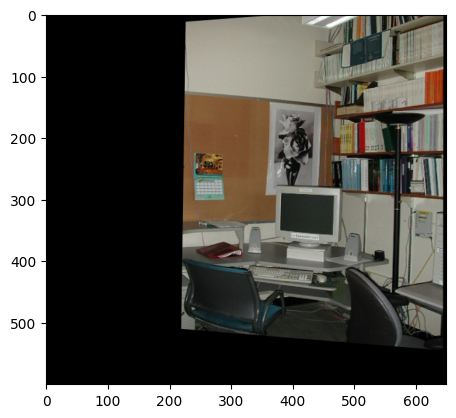

In [27]:
## perform image warping
transform = skimage.transform.ProjectiveTransform(H_final)
warped_img3 = skimage.transform.warp(img3_rgb, transform, output_shape=(600, 650))

plt.imshow(warped_img3)

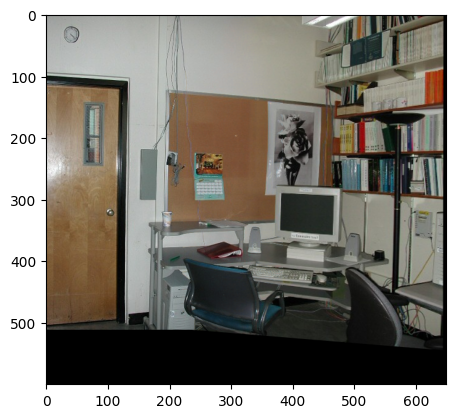

In [28]:
## add more pixels on the right of img1 to create the panorama
padded_img2 = np.pad(img2_rgb, ((0, 88), (0, 266), (0, 0)), mode='constant', constant_values=0.0).astype(np.float32) / 255.

## take the maximum of both images
plt.imshow(np.maximum(padded_img2, warped_img3))

Now, stitch the left and stitched image together

In [29]:
## secondly, stitch the first and stitched images
## load and convert both images to grayscale
img1_bgr = cv2.imread('images/room-left.jpg')

img1_rgb = cv2.cvtColor(img1_bgr, cv2.COLOR_BGR2RGB)
img4_rgb = (np.maximum(padded_img2, warped_img3) * 255.).astype(np.uint8)

img1_gray = cv2.cvtColor(img1_bgr, cv2.COLOR_BGR2GRAY)
img4_gray = cv2.cvtColor(img4_rgb, cv2.COLOR_RGB2GRAY)

detect keypoints and extract descriptors

In [30]:
kp1, des1 = cv2.SIFT_create().detectAndCompute(img1_gray, None)
kp4, des4 = cv2.SIFT_create().detectAndCompute(img4_gray, None)

match features

In [31]:
dm2 = scipy.spatial.distance.cdist(des1, des4, 'sqeuclidean')

prune features

In [32]:
## n = number of best matches
n = 30

## sort and get best n matches
dm2_sorted = np.argsort(dm2.flatten())[:n]
row2, col2 = np.unravel_index(dm2_sorted, dm2.shape)

## convert keypoints from cv2.KeyPoint to np.float64, only keep top n matches
kp1_closest = np.array([kp.pt for kp in kp1])[row2]
kp4_closest = np.array([kp.pt for kp in kp4])[col2]

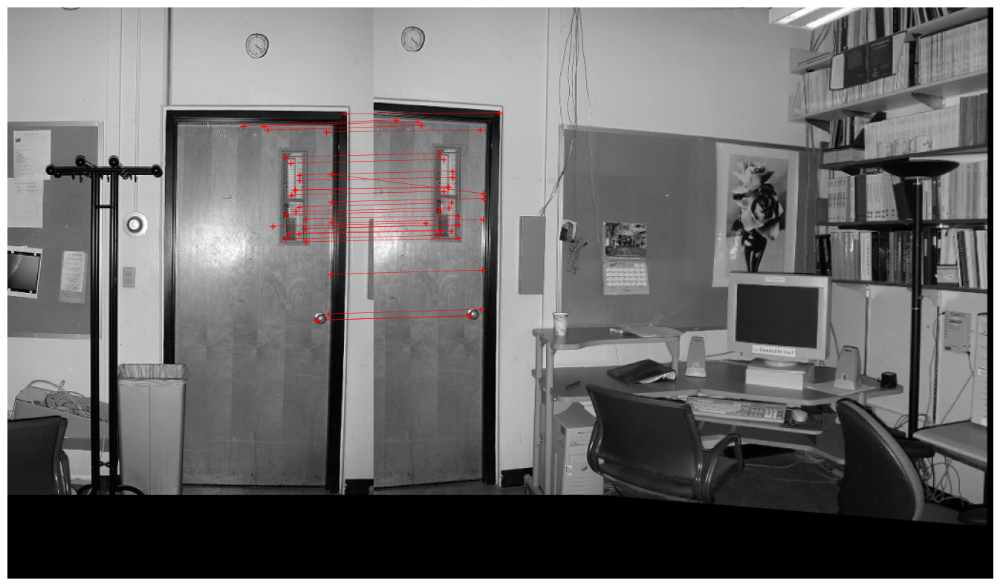

In [33]:
## visualize keypoints
inlier_matrix2 = np.hstack((kp1_closest, kp4_closest))
fig, ax = plt.subplots(figsize=(20, 10))
plot_inlier_matches(ax, np.pad(img1_gray, ((0, img4_gray.shape[0] - img1_gray.shape[0]), (0, 0)), mode='constant', constant_values=0.0), img4_gray, inlier_matrix2)

robust transformation estimation

In [34]:
## define number of iterations and threshold
num_iter = 200
threshold = 0.15

## variables to hold best inliers and count
inlier_count = 0
best_inliers_idx = None

## RANSAC
for i in range(num_iter):
    retry_iteration = True

    while retry_iteration:
        try:
            ## select 4 random minimum points
            random_idx = np.random.choice(kp1_closest.shape[0], size=4, replace=False)

            img1_pts = kp1_closest[random_idx]
            img4_pts = kp4_closest[random_idx]

            ## construct matrix A as given by model fitting notes page 196
            ## append homogeneous equations, two for each set of points, eight in total
            A = []
            
            for pt in range(4):
                x0, y0 = img1_pts[pt]
                x1, y1 = img4_pts[pt]
                A.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
                A.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

            ## estimate homography with SVD
            U, S, V = np.linalg.svd(np.array(A))
            H = V[len(V)-1].reshape(3, 3)

            ## calculate the n x2 points with the estimated T and c
            img4_new = np.hstack((kp1_closest, np.ones((kp1_closest.shape[0], 1)))) @ np.transpose(H)
            
            ## divide by last component
            for r in range(img4_new.shape[0]):
                img4_new[r, :2] /= img4_new[r, 2]

            ## remove the last column because we only need x and y
            img4_new = img4_new[:, :-1]

            ## compute the euclidean distance and count entries that are within the radius threshold
            distance = np.linalg.norm(img4_new - kp4_closest, axis=1)
            inliers = np.where(distance < threshold)[0]
            count = len(inliers)

            ## save the best affine matrix and inlier counts
            if count > inlier_count:
                inlier_count = count
                best_inliers_idx = inliers

            print(f"Iteration {i} - count (current): {count} - count (best): {inlier_count}")
            retry_iteration = False

        ## sometimes A does not have an inverse, in that case, choose 3 sets of points randomly again
        except LinAlgError:
            continue

Iteration 0 - count (current): 5 - count (best): 5
Iteration 1 - count (current): 5 - count (best): 5
Iteration 2 - count (current): 5 - count (best): 5
Iteration 3 - count (current): 4 - count (best): 5
Iteration 4 - count (current): 4 - count (best): 5
Iteration 5 - count (current): 4 - count (best): 5
Iteration 6 - count (current): 5 - count (best): 5
Iteration 7 - count (current): 5 - count (best): 5
Iteration 8 - count (current): 5 - count (best): 5
Iteration 9 - count (current): 6 - count (best): 6
Iteration 10 - count (current): 5 - count (best): 6
Iteration 11 - count (current): 5 - count (best): 6
Iteration 12 - count (current): 5 - count (best): 6
Iteration 13 - count (current): 4 - count (best): 6
Iteration 14 - count (current): 5 - count (best): 6
Iteration 15 - count (current): 5 - count (best): 6
Iteration 16 - count (current): 5 - count (best): 6
Iteration 17 - count (current): 5 - count (best): 6
Iteration 18 - count (current): 4 - count (best): 6
Iteration 19 - count (

compute optimal transformation

In [35]:
## get all the inliers of the best transformation found using RANSAC
img1_pts_final = kp1_closest[best_inliers_idx]
img4_pts_final = kp4_closest[best_inliers_idx]

A_final = []

for pt in range(inlier_count):
    x0, y0 = img1_pts_final[pt]
    x1, y1 = img4_pts_final[pt]
    A_final.append([x0, y0, 1, 0, 0, 0, -x0*x1, -y0*x1, -x1])
    A_final.append([0, 0, 0, x0, y0, 1, -x0*y1, -y0*y1, -y1])

## compute the final T and c with least-squares
U_final, S_final, V_final = np.linalg.svd(np.array(A_final))
H_final = V_final[len(V_final)-1].reshape(3, 3)

create final panorama

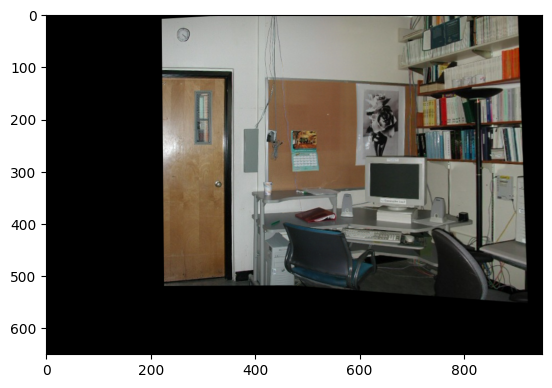

In [36]:
## perform image warping
transform = skimage.transform.ProjectiveTransform(H_final)
warped_img4 = skimage.transform.warp(img4_rgb, transform, output_shape=(650, 950))

plt.imshow(warped_img4)

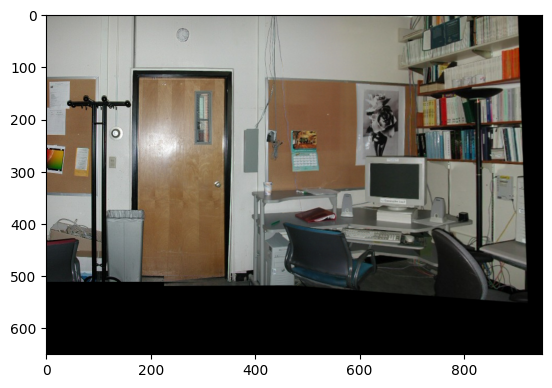

In [37]:
## add more pixels on the right of img1 to create the panorama
padded_img1 = np.pad(img1_rgb, ((0, 138), (0, 566), (0, 0)), mode='constant', constant_values=0.0).astype(np.float32) / 255.

## take the maximum of both images
plt.imshow(np.maximum(padded_img1, warped_img4))